In [241]:
import cv2  # OpenCV for computer vision and image processing
import imageio  # Library for reading and writing image data
import numpy as np  # Library for numerical computing
import matplotlib.pyplot as plt  # Library for plotting and visualization
import matplotlib.image as mpimg  # Module for reading and displaying images
import imutils  # Utility functions for image processing tasks
from skimage.feature import peak_local_max  # Function for finding local peaks in images
import skimage.feature  # Module for various image feature extraction methods
from scipy.spatial import distance  # Module for calculating distances between points
from numpy.linalg import lstsq  # Function for solving linear least squares problems
from skimage.color import rgb2gray  # Function for converting RGB images to grayscale
from skimage.feature import plot_matches  # Function for visualizing feature matches

In [242]:
# Read images from file paths 
image1 = mpimg.imread("//Users/murad/Downloads/image1.png")  # Read the first image
image2 = mpimg.imread("//Users/murad/Downloads/image2.png")  # Read the second image


images = [image1, image2]  # List containing both images


Number of keypoints before filtration - Image 1: 475
Number of keypoints before filtration - Image 2: 489


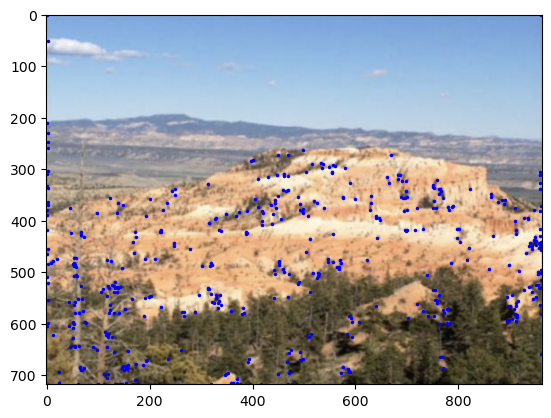

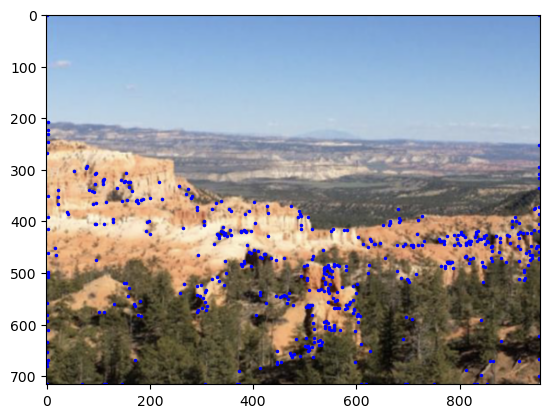

In [243]:
# Load and preprocess the first image
img1 = cv2.imread("//Users/murad/Downloads/image1.png")  # Read the first image
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB color space
img1_grey = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)  # Convert the image to grayscale
# Compute Harris corner response for the first image
harris_image1 = skimage.feature.corner_harris(img1_grey)
# Find local maxima in the Harris response map to identify keypoints
left_keypoints = skimage.feature.peak_local_max(harris_image1, min_distance=1, threshold_abs=0.01)

# Load and preprocess the second image
img2 = cv2.imread("//Users/murad/Downloads/image2.png")  # Read the second image
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB color space
img2_grey = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)  # Convert the image to grayscale
# Compute Harris corner response for the second image
harris_image2 = skimage.feature.corner_harris(img2_grey)
# Find local maxima in the Harris response map to identify keypoints
right_keypoints = skimage.feature.peak_local_max(harris_image2, min_distance=1, threshold_abs=0.01)

# Print number of keypoints before filtration
print("Number of keypoints before filtration - Image 1:", len(left_keypoints))
print("Number of keypoints before filtration - Image 2:", len(right_keypoints))

# Visualize keypoints on the first image
plt.imshow(img1, cmap='gray')  # Display the first image
plt.plot(left_keypoints[:, 1], left_keypoints[:, 0], 'b.', markersize=3)  # Plot keypoints on the image
plt.show()  # Show the plot

# Visualize keypoints on the second image
plt.imshow(img2, cmap='gray')  # Display the second image
plt.plot(right_keypoints[:, 1], right_keypoints[:, 0], 'b.', markersize=3)  # Plot keypoints on the image
plt.show()  # Show the plot


In [244]:
size = 11  # Size of the filter window

image_height, image_width = img1_grey.shape  # Get image dimensions

# Filter the keypoints for img1
filtered_keypoints1 = []
for kp1 in left_keypoints:
    y, x = kp1
    # Check if the keypoint is within the image bounds
    if 0 <= x < img1.shape[0] and 0 <= y < img1.shape[1]:
        filtered_keypoints1.append(kp1)

# Filter the keypoints for img2
filtered_keypoints2 = []
for kp2 in right_keypoints:
    y, x = kp2
    # Check if the keypoint is within the image bounds
    if 0 <= x < img2.shape[0] and 0 <= y < img2.shape[1]:
        filtered_keypoints2.append(kp2)

# Print number of keypoints after filtration
print("Number of keypoints after filtration - Image 1:", len(filtered_keypoints1))
print("Number of keypoints after filtration - Image 2:", len(filtered_keypoints2))


Number of keypoints after filtration - Image 1: 351
Number of keypoints after filtration - Image 2: 355


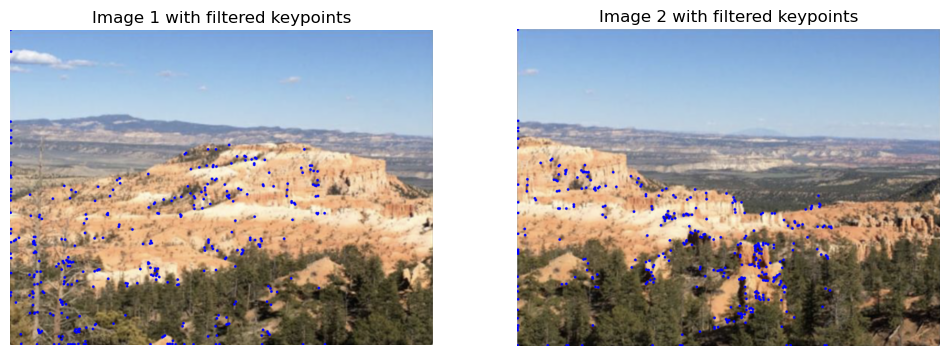

In [245]:
# Create copies of the images to mark keypoints
image_with_keypoints1 = np.copy(img1)
image_with_keypoints2 = np.copy(img2)

# Mark keypoints on the first image
for kp1 in filtered_keypoints1:
    x, y = kp1
    cv2.circle(image_with_keypoints1, (y, x), 3, (0, 0, 255), -1)  # Draw a blue circle at the keypoint location

# Mark keypoints on the second image
for kp2 in filtered_keypoints2:
    x, y = kp2
    cv2.circle(image_with_keypoints2, (y, x), 3, (0, 0, 255), -1)  # Draw a blue circle at the keypoint location

# Display the images with keypoints
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image_with_keypoints1)
plt.title("Image 1 with filtered keypoints")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(image_with_keypoints2)
plt.title("Image 2 with filtered keypoints")
plt.axis("off")

plt.show()

# 1. Detect keypoints using Harris corner detection algorithm & extract fixed-size patches around every keypoint.

/var/folders/_w/d0wdbx015f30z7zvv4k2hcdw0000gn/T/ipykernel_73988/1789724172.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_path)[:,:,:3]  # Remove alpha channel if present


Number of keypoints detected in the first image: 17917
Number of keypoints detected in the second image: 17625


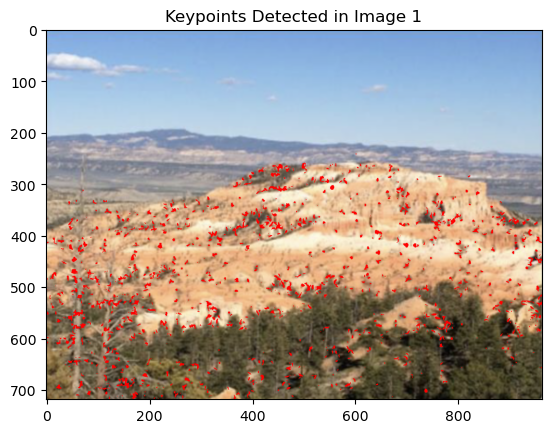

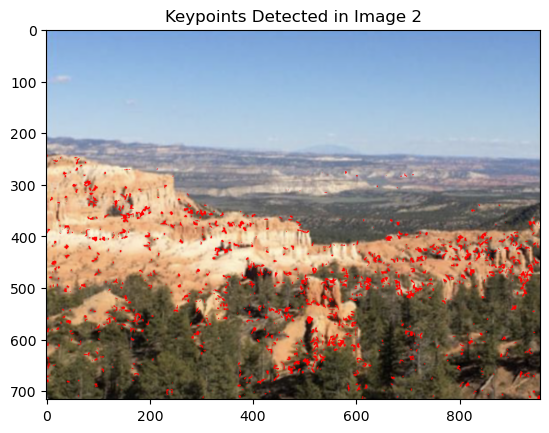

In [246]:
#Using cv2.cornerHarris for more parameters
def find_Harris_Key_Points(image_path, block_Size=7, ksize=3, k=0.2, peak_Threshold=0.01, kp_Diameter=11):
    '''
    Detects keypoints using Harris corner detection algorithm.

    Args:
        image_path (str): Path to the image file.
        block_Size (int): Size of the neighborhood for corner detection (default 9).
        ksize (int): Aperture parameter for the Sobel operator (default 7).
        k (float): Free parameter of the Harris detector (default 0.2).
        peak_Threshold (float): Threshold for corner detection (default 0.01).
        kp_Diameter (int): Diameter of keypoints (default 10).

    Returns:
        tuple: Tuple containing the original image, keypoints as OpenCV objects,
               keypoints as numpy arrays, and the resulting image.
    '''
    # Read the image
    img = imageio.imread(image_path)[:,:,:3]  # Remove alpha channel if present
    # Convert image to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Convert to float32 for Harris corner detection
    gray_img = np.float32(gray_img)
    # Apply Harris corner detection
    dst = cv2.cornerHarris(gray_img, blockSize=block_Size, ksize=ksize, k=k)
    # Create a copy of the original image for visualization
    result_img = img.copy()
    # Draw Harris corner features on the image in red
    dst=dst > peak_Threshold * dst.max()
    result_img[dst] = [255, 0, 0]
    # Extract keypoints where dst is greater than the threshold
    k_points = np.argwhere(dst > peak_Threshold * dst.max())
    # extract fixed-size patches using kp_diameter
    k_points_CV = [cv2.KeyPoint(float(x[1]), float(x[0]), kp_Diameter) for x in k_points]

    return img, dst, k_points_CV, k_points, result_img

# Get keypoints for the first image
leftImage, dst1, keypoints1, keypoints_for_plotting1, result1 = find_Harris_Key_Points("//Users/murad/Downloads/image1.png")
# Get keypoints for the second image
rightImage, dst2, keypoints2, keypoints_for_plotting2, result2 = find_Harris_Key_Points("//Users/murad/Downloads/image2.png")

# Print the number of keypoints found in each image
print("Number of keypoints detected in the first image:", len(keypoints1))
print("Number of keypoints detected in the second image:", len(keypoints2))

# Visualize the correspondences
plt.imshow(result1)
plt.title('Keypoints Detected in Image 1')
plt.show()

plt.imshow(result2)
plt.title('Keypoints Detected in Image 2')
plt.show()


# 2. compute SIFT descriptors on the resulted key-points from Harris corner detector.

In [248]:
DESCRIPTOR_TYPE = 'SIFT' # 'SIFT' or 'PATCH'
DISTANCE_METRIC='euclidean' # 'euclidean' or 'correlation' 
PATCH_SIZE=11

In [249]:
#with SIFT
def compute_SIFT_descriptors(key_points, image, visualize=True):
    '''
    Computes SIFT descriptors for given keypoints on an image.

    Args:
        key_points (list): List of keypoints.
        image (numpy.ndarray): Input image.
        visualize (bool): Whether to visualize keypoints on the image (default is True).

    Returns:
        numpy.ndarray: SIFT descriptors computed for the keypoints.
    '''
    # Normalize image for keypoint detection
    normalized_image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')

    # Create SIFT object
    sift = cv2.SIFT_create() 
    # Detect keypoints and compute descriptors
    _, descriptors = sift.compute(normalized_image, key_points)
    
    if visualize:
        # Visualize keypoints on the image
        img_with_keypoints = cv2.drawKeypoints(image, key_points, image)
        plt.imshow(img_with_keypoints)
        plt.show()
    
    return descriptors


In [250]:
#without SIFT
def get_keypoints(image, size=9, threshold=0.01, min_distance=1):
    '''
    Detects keypoints in an image using Harris corner detection without SIFT.

    Args:
        image (numpy.ndarray): Input image.
        size (int): Size of the filter window (default is 9).
        threshold (float): Threshold for corner detection (default is 0.01).
        min_distance (int): Minimum distance between detected keypoints (default is 1).

    Returns:
        tuple: Tuple containing filtered keypoints and corresponding patches.
    '''
    # Convert the image to grayscale if it's not already
    image_grey = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Calculate Harris corner score
    harris_image = skimage.feature.corner_harris(image_grey)
    
    # Get keypoints by taking the local maximums of the corner scores
    keypoints = skimage.feature.peak_local_max(harris_image, min_distance=min_distance, threshold_abs=threshold)
    
    # Filter the keypoints that fall within image boundaries
    filtered_keypoints = [kp for kp in keypoints if
                          (size // 2 <= kp[0] < image_grey.shape[0] - size // 2) and
                          (size // 2 <= kp[1] < image_grey.shape[1] - size // 2)]

    # Create an array to represent the image with keypoints
    image_with_keypoints = np.copy(image_grey)
    for kp in filtered_keypoints:
        x, y = kp
        image_with_keypoints[x, y] = 255

    # Extract patches around keypoints
    patches = [image_grey[x - size // 2:x + size // 2 + 1, y - size // 2:y + size // 2 + 1] for x, y in
               filtered_keypoints]

    return filtered_keypoints, patches


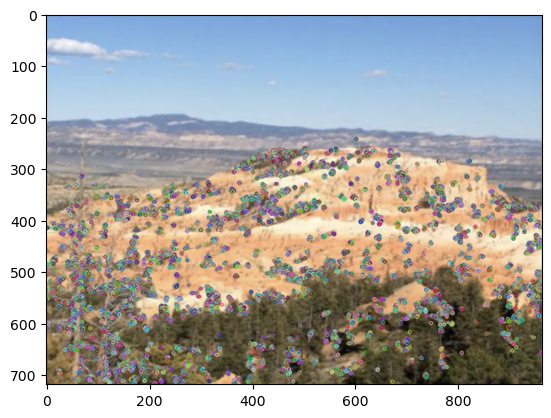

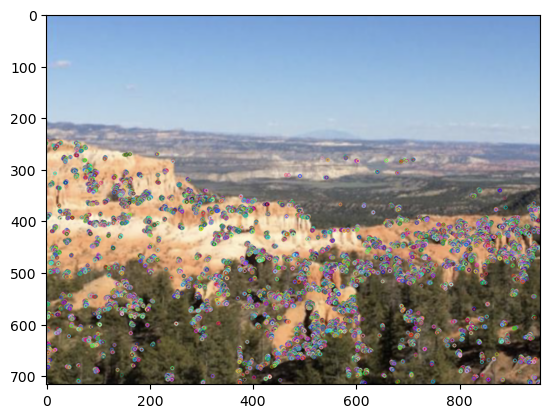

In [251]:
# Check if SIFT descriptors are to be used
if DESCRIPTOR_TYPE == 'SIFT':
    # using SIFT, compute descriptors for keypoints detected in both images
    descriptors1 = compute_SIFT_descriptors(keypoints1, result1)
    descriptors2 = compute_SIFT_descriptors(keypoints2, result2)
else:
    # without SIFT, extract keypoints and patches from both images
    keypoints1, patches1 = get_keypoints(img1)
    keypoints2, patches2 = get_keypoints(img2)

    # patches for comparison
    patch_ex1 = patches1[1]
    patch_ex2 = patches2[1]
    
    # functions for patch normalization and similarity measures
    
    def normalize_patch(patch):
        # Normalize patch by subtracting mean and dividing by standard deviation
        mean = np.mean(patch)
        sd = np.std(patch)
        return (patch - mean) / sd

    def normalized_correlation(patch1, patch2):
        # Compute normalized correlation between two patches
        patch1_norm = normalize_patch(patch1)
        patch2_norm = normalize_patch(patch2)

        numerator = np.sum(patch1_norm * patch2_norm)
        denominator = np.sqrt(np.sum(patch1_norm**2) * np.sum(patch2_norm**2))

        return numerator / denominator

    def euclidean_distance(patch1, patch2):
        # Compute Euclidean distance between two patches
        patch1_norm = normalize_patch(patch1)
        patch2_norm = normalize_patch(patch2)

        patch1fl = patch1_norm.flatten()
        patch2fl = patch2_norm.flatten()

        return distance.euclidean(patch1fl, patch2fl)

    print("Example Patch 1:", patch_ex1)
    print("Normalized Correlation:", normalized_correlation(patch_ex1, patch_ex2))
    print("Euclidean Distance:", euclidean_distance(patch_ex1, patch_ex2))


In [252]:
keypoints1

[< cv2.KeyPoint 0x168cefae0>,
 < cv2.KeyPoint 0x168cef6f0>,
 < cv2.KeyPoint 0x142fdc810>,
 < cv2.KeyPoint 0x142fdd4a0>,
 < cv2.KeyPoint 0x142fde550>,
 < cv2.KeyPoint 0x142fdf3c0>,
 < cv2.KeyPoint 0x142fdc630>,
 < cv2.KeyPoint 0x142fdd110>,
 < cv2.KeyPoint 0x142fdc9c0>,
 < cv2.KeyPoint 0x142fdd3e0>,
 < cv2.KeyPoint 0x142fddb90>,
 < cv2.KeyPoint 0x142fddda0>,
 < cv2.KeyPoint 0x142fdea90>,
 < cv2.KeyPoint 0x142fdeaf0>,
 < cv2.KeyPoint 0x142fdd3b0>,
 < cv2.KeyPoint 0x142fdeb80>,
 < cv2.KeyPoint 0x142fdd080>,
 < cv2.KeyPoint 0x142fdc510>,
 < cv2.KeyPoint 0x142fdd440>,
 < cv2.KeyPoint 0x142fdcd20>,
 < cv2.KeyPoint 0x142fdf750>,
 < cv2.KeyPoint 0x142fdf240>,
 < cv2.KeyPoint 0x142fdcc90>,
 < cv2.KeyPoint 0x142fdd950>,
 < cv2.KeyPoint 0x142fdd170>,
 < cv2.KeyPoint 0x142fde490>,
 < cv2.KeyPoint 0x142fdcf00>,
 < cv2.KeyPoint 0x142fdec40>,
 < cv2.KeyPoint 0x142fdf390>,
 < cv2.KeyPoint 0x143005950>,
 < cv2.KeyPoint 0x143005830>,
 < cv2.KeyPoint 0x143005ec0>,
 < cv2.KeyPoint 0x143006250>,
 < cv2.Key

In [253]:
keypoint_values1 = []
keypoint_values2 = []
for keypoint in keypoints1:
    x, y = map(int, keypoint.pt)
    # Append the integer coordinates to the keypoint_values list
    keypoint_values1.append((x, y))

for keypoint in keypoints2:
    x, y = map(int, keypoint.pt)
    # Append the integer coordinates to the keypoint_values list
    keypoint_values2.append((x, y))

In [254]:
keypoint_values1

[(600, 242),
 (601, 242),
 (602, 242),
 (501, 259),
 (498, 260),
 (499, 260),
 (500, 260),
 (501, 260),
 (502, 260),
 (503, 260),
 (497, 261),
 (498, 261),
 (499, 261),
 (500, 261),
 (501, 261),
 (503, 261),
 (561, 261),
 (562, 261),
 (609, 261),
 (452, 262),
 (453, 262),
 (454, 262),
 (455, 262),
 (497, 262),
 (498, 262),
 (499, 262),
 (500, 262),
 (503, 262),
 (555, 262),
 (556, 262),
 (561, 262),
 (562, 262),
 (609, 262),
 (610, 262),
 (451, 263),
 (452, 263),
 (453, 263),
 (454, 263),
 (455, 263),
 (456, 263),
 (497, 263),
 (498, 263),
 (499, 263),
 (500, 263),
 (503, 263),
 (551, 263),
 (555, 263),
 (562, 263),
 (609, 263),
 (610, 263),
 (665, 263),
 (666, 263),
 (667, 263),
 (668, 263),
 (440, 264),
 (441, 264),
 (443, 264),
 (444, 264),
 (451, 264),
 (452, 264),
 (453, 264),
 (454, 264),
 (455, 264),
 (456, 264),
 (457, 264),
 (467, 264),
 (497, 264),
 (498, 264),
 (499, 264),
 (500, 264),
 (503, 264),
 (551, 264),
 (552, 264),
 (561, 264),
 (562, 264),
 (609, 264),
 (610, 264),

In [255]:
left_keypoints

array([[  1,   1],
       [716, 960],
       [  1, 960],
       [456, 960],
       [716, 376],
       [417,   1],
       [389,   1],
       [441, 960],
       [502, 960],
       [464,   1],
       [496, 960],
       [549, 329],
       [333,   1],
       [356, 771],
       [210,   1],
       [599, 783],
       [560, 325],
       [449, 943],
       [566, 901],
       [716,  61],
       [510,   1],
       [309,   1],
       [378,   1],
       [426, 911],
       [716, 319],
       [565, 896],
       [544, 330],
       [447, 951],
       [444, 939],
       [310, 682],
       [273, 468],
       [520,   2],
       [529, 937],
       [598, 778],
       [496, 442],
       [338, 765],
       [556, 334],
       [566, 912],
       [347, 864],
       [716, 172],
       [716, 142],
       [716, 146],
       [431, 949],
       [490,  57],
       [380, 695],
       [589, 592],
       [579, 122],
       [450, 960],
       [443, 956],
       [696, 352],
       [472,  54],
       [671, 492],
       [556,

# 3. Compute the distances between every descriptor

In [256]:
#without SIFT
def select_best_matches(patches1, patches2, method="euclidean", top_few=100):
    '''
    Selects the best matches between two sets of patches based on a specified method.

    Args:
        patches1 (list): List of patches from the first image.
        patches2 (list): List of patches from the second image.
        method (str): Method for selecting matches, either "correlation" or "euclidean" (default is "euclidean").
        top_few (int): Number of top matches to select (default is 100).

    Returns:
        list: List of indices representing the selected matches.
    '''
    height = len(patches1)
    width = len(patches2)
    selected_matches = []

    if method == "correlation":
        correlations = []
        for i in range(height):
            for j in range(width):
                value = normalized_correlation(patches1[i], patches2[j])
                correlations.append((i, j, value))

        # Sort correlations in descending order
        correlations.sort(key=lambda x: x[2], reverse=True)

        # Select top few pairs
        for i in range(min(len(correlations), top_few)):
            selected_matches.append([correlations[i][0], correlations[i][1]])

    elif method == "euclidean":
        distances = []
        for i in range(height):
            for j in range(width):
                value = euclidean_distance(patches1[i], patches2[j])
                distances.append((i, j, value))

        # Sort distances in ascending order
        distances.sort(key=lambda x: x[2])

        # Select top few pairs
        for i in range(min(len(distances), top_few)):
            selected_matches.append([distances[i][0], distances[i][1]])

    return selected_matches


def get_matches_from_indices(index_matches, keypoints1, keypoints2):
    '''
    Retrieves matches from indices and keypoints of the two images.

    Args:
        index_matches (list): List of index pairs representing matches.
        keypoints1 (list): List of keypoints from the first image.
        keypoints2 (list): List of keypoints from the second image.

    Returns:
        list: List of matches in the format [x1, y1, x2, y2].
    '''
    matches = []
    for pairs in index_matches:
        new_list = []
        new_list.extend(keypoints1[pairs[0]].tolist() + keypoints2[pairs[1]].tolist())
        matches.append(new_list)
    return matches


def draw_matches(img1, img2, matches):
    '''
    Draws matches between two images.

    Args:
        img1 (numpy.ndarray): First image.
        img2 (numpy.ndarray): Second image.
        matches (list): List of matches in the format [x1, y1, x2, y2].
    '''
    # Convert match list to the format expected by drawMatches
    keypoints1 = [cv2.KeyPoint(x=float(match[1]), y=float(match[0]), size=1) for match in matches]
    keypoints2 = [cv2.KeyPoint(x=float(match[3]), y=float(match[2]), size=1) for match in matches]

    # Create DMatch objects
    dmatches = [cv2.DMatch(_imgIdx=0, _queryIdx=i, _trainIdx=i, _distance=0) for i in range(len(matches))]

    # Draw matches
    matched_image = cv2.drawMatches(img1, keypoints1, img2, keypoints2, dmatches, None)

    # Display the image with matches
    plt.imshow(matched_image)
    plt.axis("off")
    plt.show()


# 4. best matches based on a threshold

In [257]:
#using SIFT
def find_Matching_Descriptors(img1, kps1, descs1, img2, kps2, descs2, ratio_threshold=0.80, visualize=True):
    '''
    Finds matching descriptors between two sets of keypoints and descriptors using the brute-force matcher.

    Args:
        img1 (numpy.ndarray): First image.
        kps1 (list): Keypoints from the first image.
        descs1 (numpy.ndarray): Descriptors corresponding to the keypoints of the first image.
        img2 (numpy.ndarray): Second image.
        kps2 (list): Keypoints from the second image.
        descs2 (numpy.ndarray): Descriptors corresponding to the keypoints of the second image.
        ratio_threshold (float): Threshold for the ratio test (default is 0.80).
        visualize (bool): Whether to visualize the matches (default is True).

    Returns:
        list: List of selected matches.
    '''
    # Brute-Force Matcher with default parameters
    bf_matcher = cv2.BFMatcher()  # Uses L2 norm as distance
    matched_descriptors = bf_matcher.knnMatch(descs1, descs2, k=2)  # Finds closest k-matches of descriptors

    # Apply ratio test for selection
    selected_matches = []
    for match1, match2 in matched_descriptors:
        if match1.distance < ratio_threshold * match2.distance:  # Uses Euclidean distance
            selected_matches.append([match1])

    if visualize:
        # Draw matches
        matched_img = cv2.drawMatchesKnn(img1, kps1, img2, kps2, selected_matches, None,
                                        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.imshow(matched_img)
        fig1 = plt.figure()  # create a figure with the default size
        ax1 = fig1.add_subplot(1, 1, 1)
        ax1.imshow(matched_img, interpolation='none')
        plt.show()

    # Extract selected matches
    selected_matches = [m[0] for m in selected_matches]
    return selected_matches


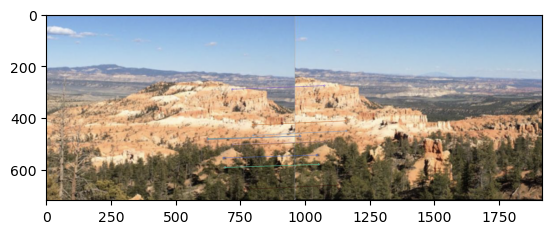

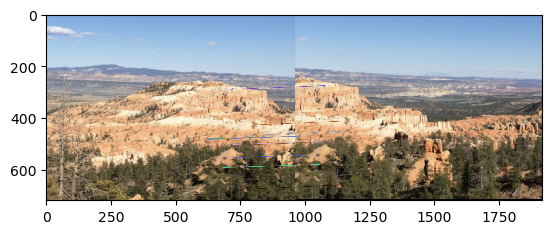

In [258]:
if DESCRIPTOR_TYPE == 'SIFT':
    # Find matches using SIFT descriptors
    matches = find_Matching_Descriptors(leftImage, keypoints1, descriptors1, rightImage, keypoints2, descriptors2)
    # Extract keypoints and coordinates
    leftKeypoints = np.float32([keypoints1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
    rightKeypoints = np.float32([keypoints2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)
    leftKPforPlotting = np.float32([keypoints_for_plotting1[m.queryIdx] for m in matches])
    rightKPforPlotting = np.float32([keypoints_for_plotting2[m.trainIdx] for m in matches])
    leftKeypointCoords = np.array([[x[0][0] for x in leftKeypoints], [y[0][1] for y in leftKeypoints]])
    rightKeypointCoords = np.array([[x[0][0] for x in rightKeypoints], [y[0][1] for y in rightKeypoints]])
else:
    # Find matches using Euclidean distance
    index_matches = select_best_matches(patches1, patches2, method="euclidean")
    # Get matches from indices and keypoints
    matches = get_matches_from_indices(index_matches, keypoints1, keypoints2)
    # Visualize matches
    draw_matches(img1, img2, matches)


In [259]:
matches_info = []
for match in matches:
    queryIdx = match.queryIdx
    trainIdx = match.trainIdx
    distance = match.distance
    matches_info.append((queryIdx, trainIdx, distance))

# Printing extracted values
for idx, match_info in enumerate(matches_info, 1):
    print(f"Match {idx}: queryIdx={match_info[0]}, trainIdx={match_info[1]}, distance={match_info[2]}")

Match 1: queryIdx=732, trainIdx=147, distance=53.06599807739258
Match 2: queryIdx=6766, trainIdx=4039, distance=48.908077239990234
Match 3: queryIdx=7991, trainIdx=6536, distance=81.92679595947266
Match 4: queryIdx=8675, trainIdx=7722, distance=132.23086547851562
Match 5: queryIdx=8676, trainIdx=7722, distance=136.62722778320312
Match 6: queryIdx=8741, trainIdx=7722, distance=134.18270874023438
Match 7: queryIdx=8742, trainIdx=7722, distance=132.24220275878906
Match 8: queryIdx=8743, trainIdx=7722, distance=136.95619201660156
Match 9: queryIdx=8744, trainIdx=7722, distance=147.89523315429688
Match 10: queryIdx=8825, trainIdx=7722, distance=145.5369415283203
Match 11: queryIdx=8826, trainIdx=7722, distance=136.9781036376953
Match 12: queryIdx=8827, trainIdx=7722, distance=135.7129364013672
Match 13: queryIdx=8828, trainIdx=7722, distance=140.82968139648438
Match 14: queryIdx=8910, trainIdx=7722, distance=148.4621124267578
Match 15: queryIdx=8911, trainIdx=7722, distance=141.753311157226

# 5. simple implementation of RANSAC

In [260]:
def calculateDistanceVector(A, t, points1, points2):
    if A is not None and t is not None:
        # point estimation
        pts_est = np.dot(A, points1) + t
        # calc euclidian distance
        squared_diff = np.power(pts_est - points2, 2)
        euc_dist = np.sqrt(np.sum(squared_diff, axis=0))
    else:
        euc_dist = None
    return euc_dist

In [261]:
def estimateAffineFromPoints(leftPoints, rightPoints):
   
    # Get the number of points
    totalPoints = leftPoints.shape[1]

    # Initialize matrix M with 6 columns (affine transformation has 6 parameters)
    M = np.zeros((2 * totalPoints, 6))

    for i in range(totalPoints):
        # Form the matrix M
        tmp = [[leftPoints[0, i], leftPoints[1, i], 0, 0, 1, 0],
                [0, 0, leftPoints[0, i][0], leftPoints[1, i][0], 0, 1]]
        M[2 * i: 2 * i + 2, :] = np.array(tmp, dtype=object)

    # Form the matrix b, containing all known target points
    b = rightPoints.T.reshape((2 * totalPoints, 1))

    try:
        # Solve the linear equation with least squares method
        theta = lstsq(M, b, rcond=None)[0]
        A = theta[:4].reshape((2, 2))
        t = theta[4:]
    except np.linalg.linalg.LinAlgError: # M is singular matrix
        A = None
        t = None

    # M = np.hstack((A, t))
    return A, t


In [262]:
def estimateAffineWithRansac(leftKeypoints, rightKeypoints, iterations = 2000, min_points = False, threshold = False):
    '''
        Function that robustly estimates an affine transformation between 2 images with Ransac
    '''

    # Initialize the number of inliers
    inliers_candidate = 0

    # Initialize the affine transformation A and t,
    # and a vector that stores indices of inliers
    A_best= None
    t_best= None
    inliers_best = None
    best_average_distance = None # quality

    for _ in range(iterations):
        # Randomly pick 'min_points' points 
        idx = np.random.randint(0, leftKeypoints.shape[1], (min_points, 1))
        # Estimate affine transformation by these points

        A_candidate, t_candidate = estimateAffineFromPoints(leftKeypoints[:, idx], rightKeypoints[:, idx])

        # we are looking to minimize the distance between points, given a candidate transformation
        # Calculate the euclidean distances of pointpairs 
        distances = calculateDistanceVector(A_candidate, t_candidate, leftKeypoints, rightKeypoints)        
        if distances is not None and len(distances) >= min_points:
            # count the inliers within the threshold
            inliers_candidate = np.where(distances < threshold)
            # Obtain the number of inliers
            num_inliers_candidate = len(inliers_candidate[0])

            # keep track of best Affine transform found so far
            if inliers_best is None or num_inliers_candidate > len(inliers_best[0]):
                # Update the number of inliers
                inliers_best = inliers_candidate
                # Set returned value
                A_best = A_candidate
                t_best = t_candidate
                best_average_distance = np.average(distances)
        else:
            pass
    if inliers_best is None:
        best_average_distance = float("inf")
        inliers_best = [float("inf")]

    return A_best, t_best, inliers_best[0], best_average_distance

A, t, inliers, avg_distance = estimateAffineWithRansac(leftKeypointCoords, rightKeypointCoords, 2000, min_points=4, threshold=2)


# 6. Warp image 2 onto image 1

In [263]:
def stitchImagesWithTransformation(leftImage, rightImage, M):
    # Extract translation from transformation matrix
    translation = M[:2, -1]
    translation = np.abs(translation)

    # Append a row to the transformation matrix
    H = np.vstack((M, [0, 0, 1]))

    # Calculate margin based on maximum translation
    margin = np.max(translation)

    # Get dimensions of the right image
    height, width, _ = rightImage.shape

    # Calculate new shape for the warped images
    newHeight = int(height + 2 * margin)
    newWidth = int(width + 2 * margin)

    # Create an identity matrix for alignment
    alignment = np.eye(3)
    alignment[:2, 2] = margin, margin

    # Warp both images
    img_right_warped = cv2.warpPerspective(rightImage, alignment, (newWidth, newHeight), borderMode=cv2.BORDER_TRANSPARENT)
    img_left_warped = cv2.warpPerspective(leftImage, H.dot(alignment), (newWidth, newHeight), borderMode=cv2.BORDER_TRANSPARENT)

    # Replace zero pixels in the left warped image with corresponding pixels from the right warped image
    mask = np.where(img_left_warped == 0)
    img_left_warped[mask] = img_right_warped[mask]

    # Recursive cropping to remove black borders
    def recursiveCrop(frame):
        if not np.sum(frame[0]):
            return recursiveCrop(frame[1:])
        if not np.sum(frame[:, 0]):
            return recursiveCrop(frame[:, 1:])
        if not np.sum(frame[-1]):
            return recursiveCrop(frame[:-2])
        if not np.sum(frame[:, -1]):
            return recursiveCrop(frame[:, :-2])
        return frame

    return recursiveCrop(img_left_warped)


# 7. score of accuracy and visualization 

RANSAC-own:
M [[ 1.02115442e+00  3.53661869e-02 -6.35249968e+02]
 [-2.26793108e-02  1.02241447e+00 -8.32685706e+00]]
inliers [ 1  2  3  5  6  7  9 10 11 12 14 15 16 17 18 19 21]
Average keypoint distance 1.921091459148842


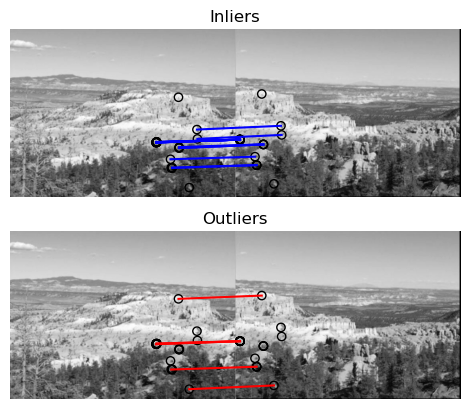

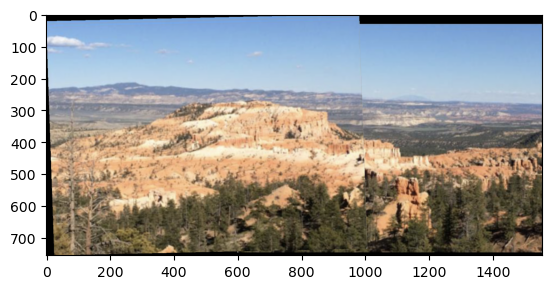

In [264]:
def visualizeCorrespondence(leftImage, rightImage, src, dst, inliers, outliers):
    # visualize correspondence
    fig, ax = plt.subplots(nrows=2, ncols=1)
    leftImage = rgb2gray(leftImage)
    rightImage = rgb2gray(rightImage)
    plt.gray()

    inlier_idxs = np.nonzero(inliers)[0]
    plot_matches(ax[0], leftImage, rightImage, src, dst,
                np.column_stack((inlier_idxs, inlier_idxs)), matches_color='b')
    ax[0].axis('off')
    ax[0].set_title('Inliers')

    outlier_idxs = np.nonzero(outliers)[0]
    plot_matches(ax[1], leftImage, rightImage, src, dst,
                np.column_stack((outlier_idxs, outlier_idxs)), matches_color='r')
    ax[1].axis('off')
    ax[1].set_title('Outliers')

    #fig.savefig('correspondance_SW.png', dpi = 1000) # change the resolution of the saved image
    plt.show()

inliers_mask = np.zeros((len(leftKeypoints)))
inliers_mask[inliers] = True

M = np.hstack((A, t))
stitchedImage = stitchImagesWithTransformation(leftImage, rightImage, M) 
# Transform image
print("RANSAC-own:")
print('M', M)
print('inliers', inliers)
print('Average keypoint distance', avg_distance)

# visualize Correspondence
visualizeCorrespondence(leftImage, rightImage, leftKPforPlotting, rightKPforPlotting, inliers_mask, inliers_mask == False) 

plt.imshow(stitchedImage)


# COMPLETE PIPELINE

/var/folders/_w/d0wdbx015f30z7zvv4k2hcdw0000gn/T/ipykernel_73988/1789724172.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_path)[:,:,:3]  # Remove alpha channel if present


Keypoints found in left Image: 18991
Keypoints found in right Image: 21830


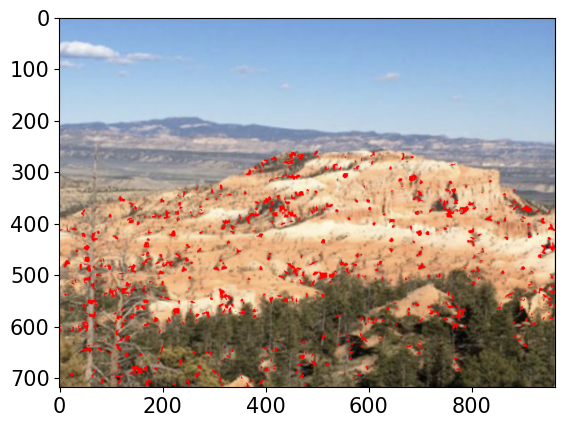

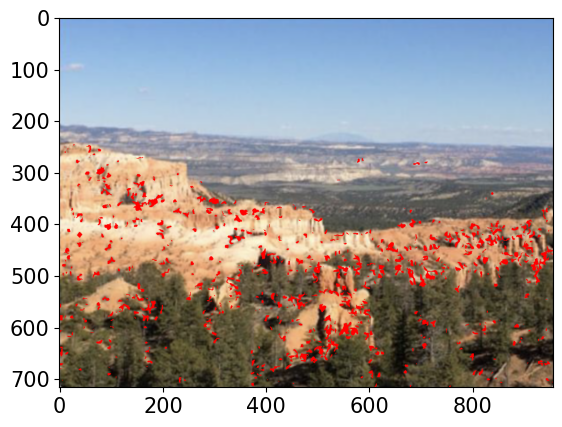

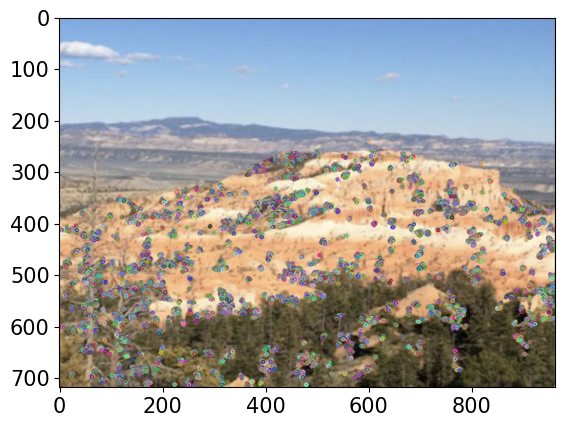

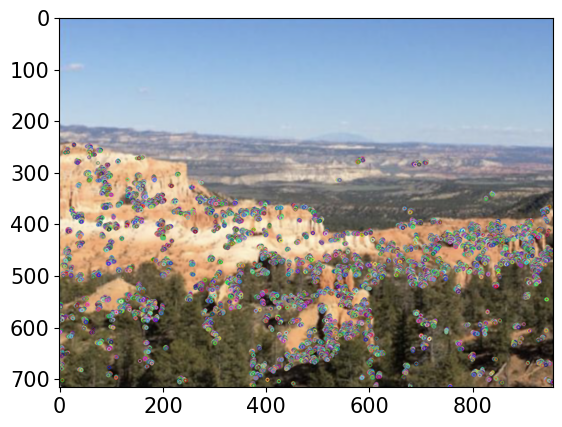

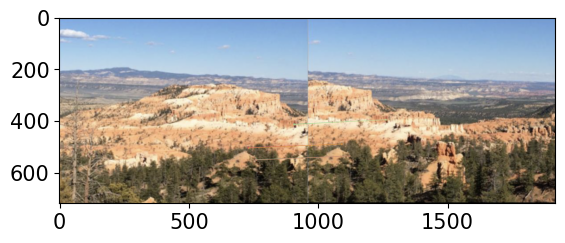

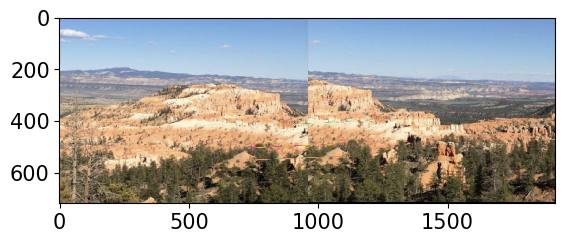

Keypoints after Matching/Thresholding: 14
inliers [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Average keypoint distance 1.0115090713138672


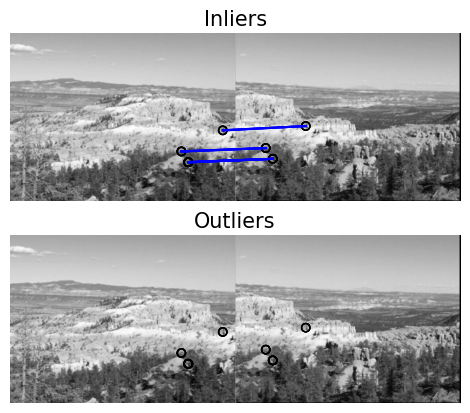

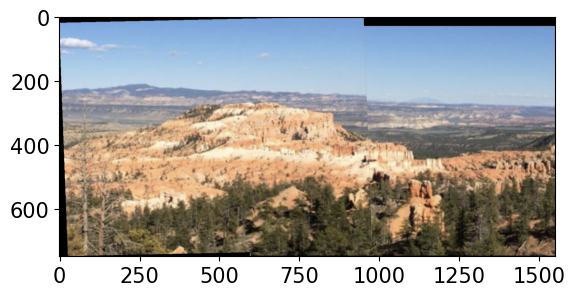

In [333]:
DISTANCE_METRIC = 'euclidean'  # 'correlation'
DESCRIPTOR_TYPE = 'SIFT'  # 'SIFT' or 'PATCH'

# Stitch image
def stitchImages(imagePath1, imagePath2, blockSize=7, ksize=3, k=0.20, peakPercent=0.01, kpDiameter=10, ratio=0.85,
                 iterations=2000, threshold_residual=2, verbose=True):
    # Function to stitch two images together

    # Find keypoints and descriptors for left image
    leftImage, dst1, leftKeypoints, leftKPforPlotting, leftResult = find_Harris_Key_Points(imagePath1, blockSize,
                                                                                           ksize, k, peakPercent,
                                                                                           kp_Diameter=kpDiameter)
    # Find keypoints and descriptors for right image
    rightImage, dst2, rightKeypoints, rightKPforPlotting, rightResult = find_Harris_Key_Points(imagePath2, blockSize,
                                                                                               ksize, k, peakPercent,
                                                                                               kp_Diameter=kpDiameter)

    if verbose:
        print("Keypoints found in left Image:", len(leftKeypoints))
        print("Keypoints found in right Image:", len(rightKeypoints))
        plt.imshow(leftResult)
        plt.show()
        plt.imshow(rightResult)
        plt.show()


    # Compute SIFT descriptors for left and right keypoints
    leftDescriptors = compute_SIFT_descriptors(leftKeypoints, leftResult, visualize=verbose)
    rightDescriptors = compute_SIFT_descriptors(rightKeypoints, rightResult, visualize=verbose)
    # Find matching descriptors between left and right images
    matches = find_Matching_Descriptors(leftImage, leftKeypoints, leftDescriptors, rightImage, rightKeypoints,
                                             rightDescriptors, ratio_threshold=ratio, visualize=verbose)

     # Update keypoints with matched keypoints
    leftKeypoints = np.float32([leftKeypoints[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    rightKeypoints = np.float32([rightKeypoints[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    leftKPforPlotting = np.float32([leftKPforPlotting[m.queryIdx] for m in matches])
    rightKPforPlotting = np.float32([rightKPforPlotting[m.trainIdx] for m in matches])
    leftKeypointCoords = np.array([[x[0][0] for x in leftKeypoints], [y[0][1] for y in leftKeypoints]])
    rightKeypointCoords = np.array([[x[0][0] for x in rightKeypoints], [y[0][1] for y in rightKeypoints]])

    # Robustly estimate affine transform model with RANSAC
    A, t, inliers, avg_distance = estimateAffineWithRansac(leftKeypointCoords, rightKeypointCoords, iterations,
                                                            min_points=4, threshold=threshold_residual)
    if avg_distance == float('inf') or inliers is None:
        return -1, avg_distance, 0
    inliers_mask = np.zeros((len(leftKeypoints)))
    inliers_mask[inliers] = True

    M = np.hstack((A, t))
    # Stitch images with transformation
    stitchedImage = stitchImagesWithTransformation(leftImage, rightImage, M)
    if verbose:
        print("Keypoints after Matching/Thresholding:", len(leftKeypoints))
        print('inliers', inliers)
        print('Average keypoint distance', avg_distance)

        # Visualize correspondence
        visualizeCorrespondence(leftImage, rightImage, leftKPforPlotting, rightKPforPlotting, inliers_mask,
                                inliers_mask == False)

        plt.imshow(stitchedImage)

    return stitchedImage, avg_distance, len(inliers)


# Example usage:
stitchedImage, avg_distance, num_inliers = stitchImages("//Users/murad/Downloads/image1.png",  
                                          "//Users/murad/Downloads/image2.png", 
                                          blockSize=9,
                                          ksize=7,
                                          k=0.20,
                                          peakPercent=0.01,
                                          kpDiameter=11,
                                          ratio=0.80,
                                          threshold_residual=2)


# Sensitivity Analysis

# Harris Corner Detection Parameters

In [278]:
def plot_results(x_values, y_values, color, ylabel='', title='', parameter=''):
    # Set font size for better readability
    fontsize = 15
    plt.rc('axes', titlesize=fontsize)     # Font size for axes titles
    plt.rc('axes', labelsize=fontsize)     # Font size for axes labels
    plt.rc('xtick', labelsize=fontsize)    # Font size for tick labels on x-axis
    plt.rc('ytick', labelsize=fontsize)    # Font size for tick labels on y-axis
    plt.rc('legend', fontsize=fontsize)    # Font size for legend

    # Set labels and title for the plot
    plt.xlabel('Parameter Value ' + parameter)  # x-axis label with parameter
    plt.ylabel(ylabel)                         # y-axis label
    plt.title(title)                           # Plot title

    # Plot the data
    plt.plot(x_values, y_values, color=color)

    # Show the plot
    plt.show()


In [290]:
avg_distances = []
num_inliers = []

for k in np.linspace(0.1, 0.24, 15):
    stitchedImage, avg_distance, inliers = stitchImages("//Users/murad/Downloads/image1.png", "//Users/murad/Downloads/image2.png", blockSize = 9, ksize=7, k=k, verbose=False)
    print(k, ":", avg_distance)
    avg_distances.append(avg_distance)
    num_inliers.append(inliers)
    

/var/folders/_w/d0wdbx015f30z7zvv4k2hcdw0000gn/T/ipykernel_73988/1789724172.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_path)[:,:,:3]  # Remove alpha channel if present


0.1 : 0.7833176036898564
0.11 : 0.3958482840755595
0.12 : 1.6460710330405004
0.13 : 1.2798930706462825
0.14 : 0.2531098162867283
0.15 : 1.5071490488790062
0.16 : 0.6305811158937935
0.16999999999999998 : 0.8007786499231178
0.18 : 1.699865441570408
0.19 : 1.328171277446288
0.19999999999999998 : 1.0390321804144067
0.21 : 30.02099366504499
0.21999999999999997 : 1.5309624802404196
0.22999999999999998 : 1.8424829555415654
0.24 : 2.316546505184829


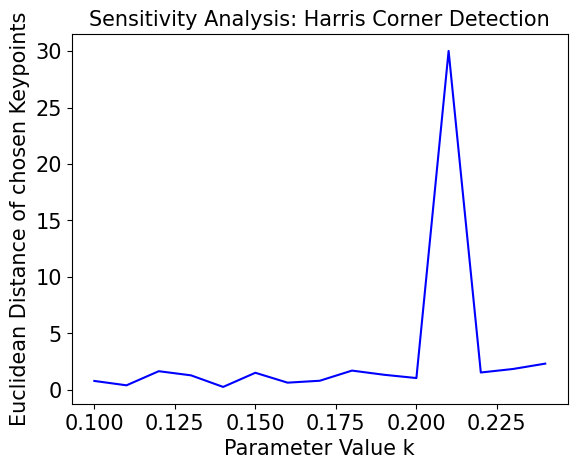

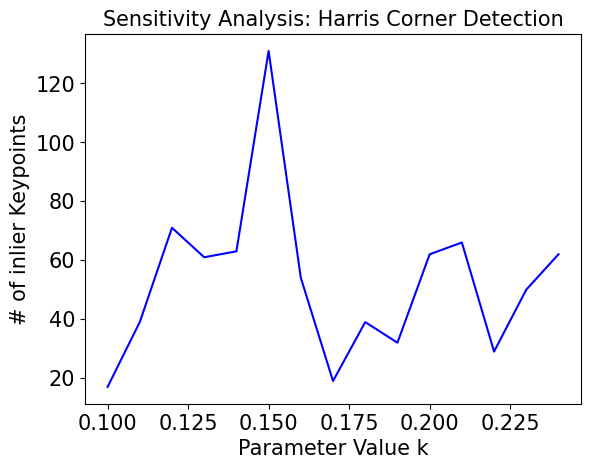

In [291]:
plot_results(np.linspace(0.1, 0.24, 15), avg_distances, 'blue', ylabel='Euclidean Distance of chosen Keypoints', title='Sensitivity Analysis: Harris Corner Detection', parameter='k')
plot_results(np.linspace(0.1, 0.24, 15), num_inliers, 'blue', ylabel='# of inlier Keypoints', title='Sensitivity Analysis: Harris Corner Detection', parameter='k')


In [292]:
avg_distances = []
num_inliers = []
k = 0.2
for blocksize in range(3,10,2):
    stitchedImage, avg_distance, inliers = stitchImages("//Users/murad/Downloads/image1.png", "//Users/murad/Downloads/image2.png", blockSize = blocksize, ksize=3, k=k, verbose=False)
    print(blocksize, ":", avg_distance)
    avg_distances.append(avg_distance)
    num_inliers.append(inliers)

/var/folders/_w/d0wdbx015f30z7zvv4k2hcdw0000gn/T/ipykernel_73988/1789724172.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_path)[:,:,:3]  # Remove alpha channel if present


3 : 5.40245290215229
5 : 21.03546676897623
7 : 327.21881032187014
9 : 1.983454515192922


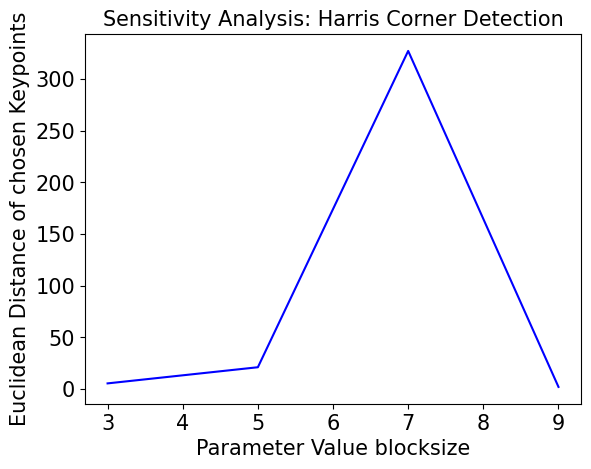

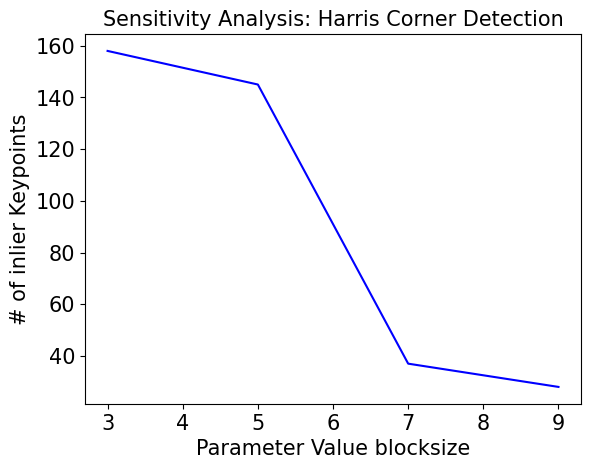

In [293]:
plot_results(range(3,10,2), avg_distances, 'blue', ylabel='Euclidean Distance of chosen Keypoints', title='Sensitivity Analysis: Harris Corner Detection', parameter='blocksize')
plot_results(range(3,10,2), num_inliers, 'blue', ylabel='# of inlier Keypoints', title='Sensitivity Analysis: Harris Corner Detection', parameter='blocksize')


In [294]:
avg_distances = []
num_inliers = []
k = 0.20
blocksize = 9
for ksize in range(3,10,2):
    stitchedImage, avg_distance, inliers = stitchImages("//Users/murad/Downloads/image1.png", "//Users/murad/Downloads/image2.png", blockSize = blocksize, ksize=ksize, k=k, verbose=False)
    print(ksize, ":", avg_distance)
    avg_distances.append(avg_distance)
    num_inliers.append(inliers)

/var/folders/_w/d0wdbx015f30z7zvv4k2hcdw0000gn/T/ipykernel_73988/1789724172.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_path)[:,:,:3]  # Remove alpha channel if present


3 : 1.9755283462750828
5 : 24.08053131996026
7 : 1.252424823256497
9 : 1.1010026714050385


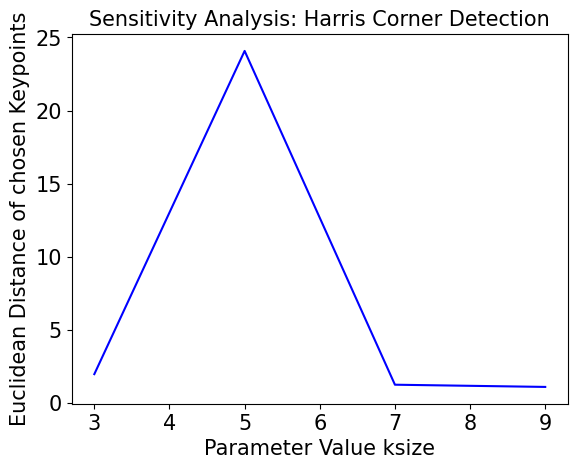

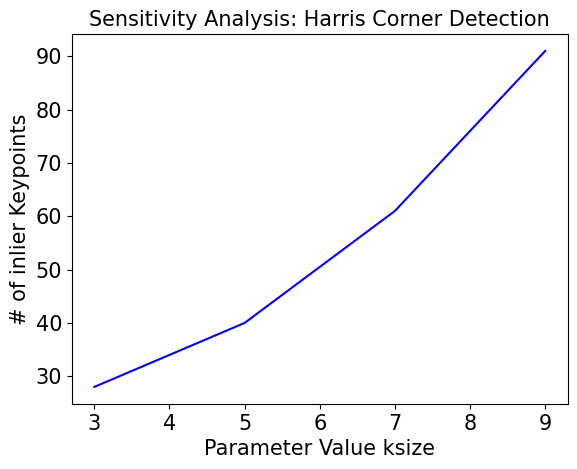

In [295]:
plot_results(range(3,10,2), avg_distances, 'blue', ylabel='Euclidean Distance of chosen Keypoints', title='Sensitivity Analysis: Harris Corner Detection', parameter='ksize')
plot_results(range(3,10,2), num_inliers, 'blue', ylabel='# of inlier Keypoints', title='Sensitivity Analysis: Harris Corner Detection', parameter='ksize')

# SIFT Parameters

In [296]:
avg_distances = []
num_inliers = []

k = 0.20
blocksize = 9
ksize=7
for kpd in np.linspace(3, 15, 13):
    stitchedImage, avg_distance, inliers = stitchImages("//Users/murad/Downloads/image1.png", "//Users/murad/Downloads/image2.png", blockSize = blocksize, ksize=ksize, k=k,kpDiameter=kpd, verbose=False)
    print(kpd, ":", avg_distance)
    avg_distances.append(avg_distance)
    num_inliers.append(inliers)

/var/folders/_w/d0wdbx015f30z7zvv4k2hcdw0000gn/T/ipykernel_73988/1789724172.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_path)[:,:,:3]  # Remove alpha channel if present


3.0 : 24.587750810682067
4.0 : 2.611130285254899
5.0 : 3.6902518189624596
6.0 : 1.4574824488667746
7.0 : 1.5311000449867946
8.0 : 1.2465652637114426
9.0 : 17.68580422127337
10.0 : 0.8438416905980489
11.0 : 1.0811240786350342
12.0 : 1.3428245566763835
13.0 : 0.9562940215548112
14.0 : 0.9106080508894818
15.0 : 0.9026143836233121


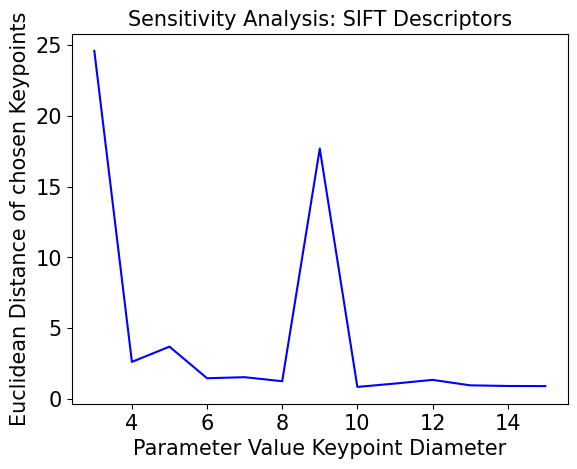

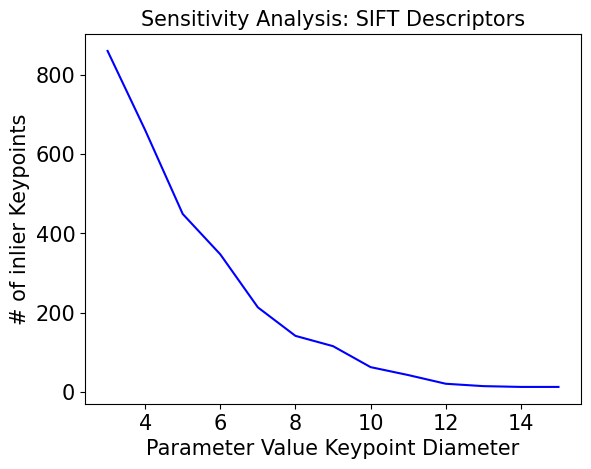

In [297]:
plot_results(np.linspace(3, 15, 13), avg_distances, 'blue', ylabel='Euclidean Distance of chosen Keypoints', title='Sensitivity Analysis: SIFT Descriptors', parameter='Keypoint Diameter')
plot_results(np.linspace(3, 15,13), num_inliers, 'blue', ylabel='# of inlier Keypoints', title='Sensitivity Analysis: SIFT Descriptors', parameter='Keypoint Diameter')


# Matching/Thresholding 

In [298]:
avg_distances = []
num_inliers = []
k = 0.20
blocksize = 9
ksize=7
kpd=13
for ratio in np.linspace(0.7, .9, 9):
    stitchedImage, avg_distance, inliers = stitchImages("//Users/murad/Downloads/image1.png", "//Users/murad/Downloads/image2.png", blockSize = blocksize, ksize=ksize, k=k,kpDiameter=kpd,ratio=ratio, verbose=False)
    print(ratio, ":", avg_distance)
    avg_distances.append(avg_distance)
    num_inliers.append(inliers)

/var/folders/_w/d0wdbx015f30z7zvv4k2hcdw0000gn/T/ipykernel_73988/1789724172.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_path)[:,:,:3]  # Remove alpha channel if present


0.7 : 0.2071931842791064
0.725 : 0.6753408146821882
0.75 : 0.9692003870231026
0.775 : 0.9092939478681686
0.8 : 0.9134798387536475
0.825 : 0.9127530215936827
0.85 : 0.9901125913673675
0.875 : 1.3439695773182265
0.9 : 20.37194371934326


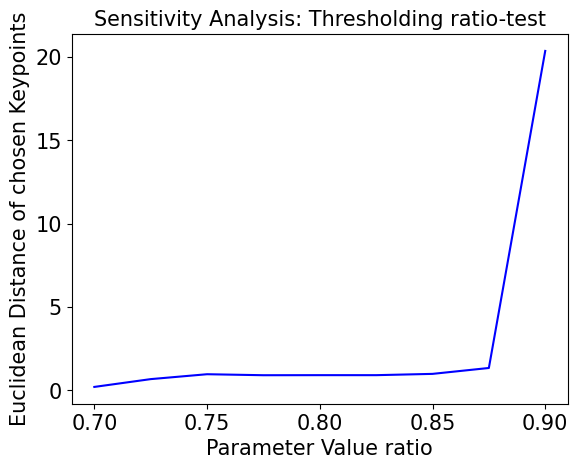

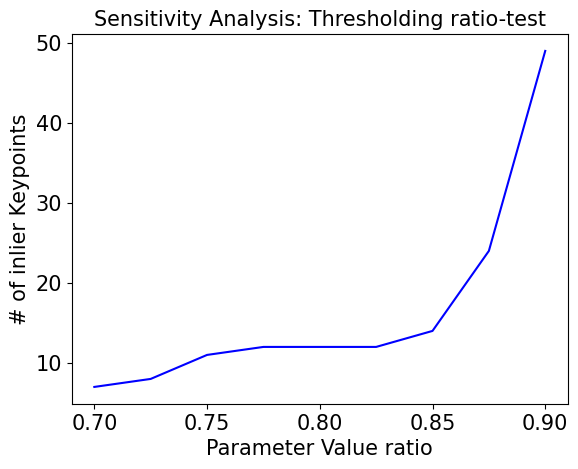

In [299]:
plot_results(np.linspace(0.7, .9, 9), avg_distances, 'blue', ylabel='Euclidean Distance of chosen Keypoints', title='Sensitivity Analysis: Thresholding ratio-test', parameter='ratio')
plot_results(np.linspace(0.7, .9, 9), num_inliers, 'blue', ylabel='# of inlier Keypoints', title='Sensitivity Analysis: Thresholding ratio-test', parameter='ratio')

In [301]:
avg_distances = []
num_inliers = []
k = 0.2
blocksize = 9
ksize=7
ratio=0.85
kpd=13

for threshold_residual in np.linspace(0.5, 3, 21):
    stitchedImage, avg_distance, inliers = stitchImages("//Users/murad/Downloads/image1.png", "//Users/murad/Downloads/image2.png", blockSize = blocksize, ksize=ksize, k=k,kpDiameter=kpd,ratio=ratio, threshold_residual=threshold_residual, verbose=False)
    print(threshold_residual, ":", avg_distance)
    avg_distances.append(avg_distance)
    num_inliers.append(inliers)





/var/folders/_w/d0wdbx015f30z7zvv4k2hcdw0000gn/T/ipykernel_73988/1789724172.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_path)[:,:,:3]  # Remove alpha channel if present


0.5 : 64.25719502143123
0.625 : 50.022134538926686
0.75 : 49.460517875265204
0.875 : 50.105973224540904
1.0 : 22.20440248764898
1.125 : 0.9279341509133135
1.25 : 0.9250683892047246
1.375 : 0.9803345187645938
1.5 : 0.9920699243347959
1.625 : 0.9898821827265426
1.75 : 1.0265543151990248
1.875 : 1.019867622752958
2.0 : 1.0205956584735925
2.125 : 0.9513636405030595
2.25 : 1.0706001809383048
2.375 : 1.088777398990787
2.5 : 1.0560396394740665
2.625 : 1.010865412484936
2.75 : 1.0826017719492984
2.875 : 1.091876616886218
3.0 : 1.1392384504404809


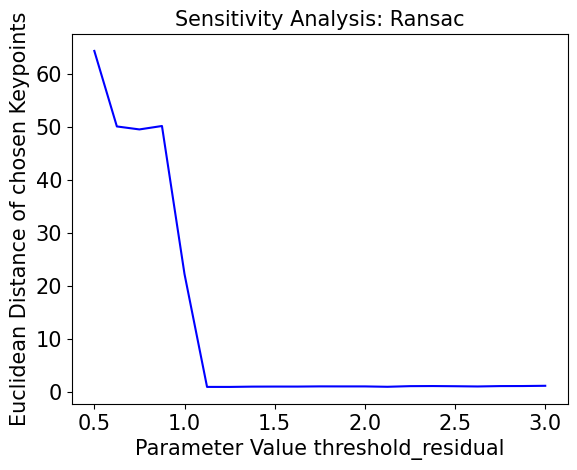

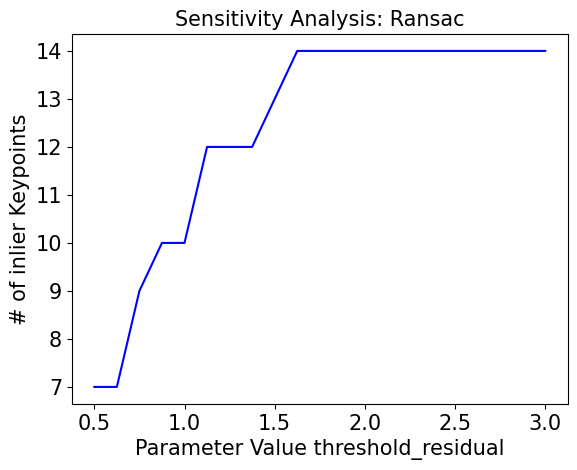

In [302]:
plot_results(np.linspace(0.5, 3, 21), avg_distances, 'blue', ylabel='Euclidean Distance of chosen Keypoints', title='Sensitivity Analysis: Ransac', parameter='threshold_residual')
plot_results(np.linspace(0.5, 3, 21), num_inliers, 'blue', ylabel='# of inlier Keypoints', title='Sensitivity Analysis: Ransac', parameter='threshold_residual')

# testing new parameters

/var/folders/_w/d0wdbx015f30z7zvv4k2hcdw0000gn/T/ipykernel_73988/1789724172.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_path)[:,:,:3]  # Remove alpha channel if present


Keypoints found in left Image: 18991
Keypoints found in right Image: 21830


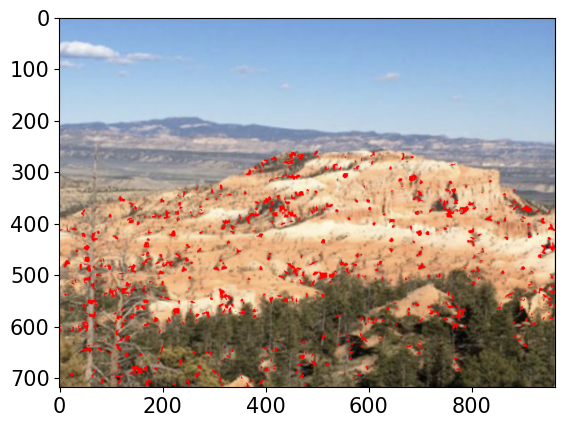

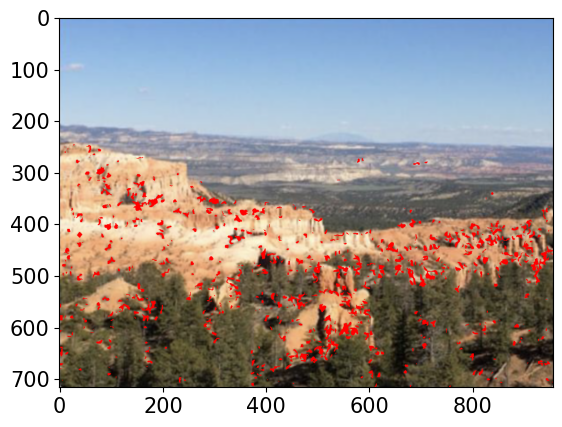

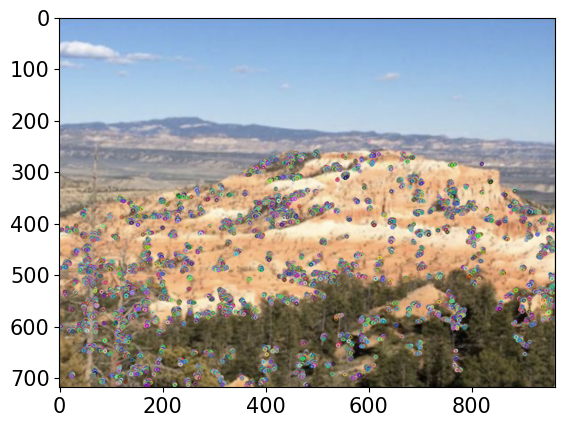

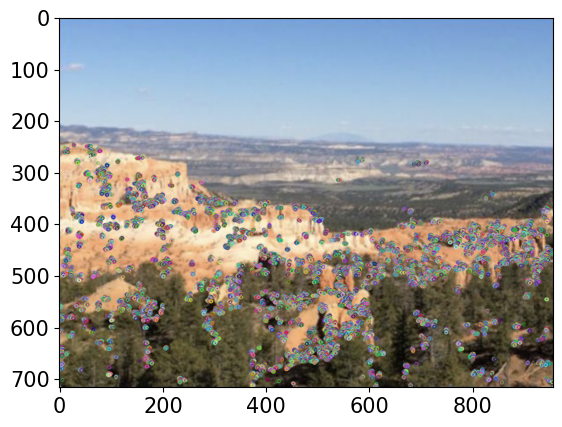

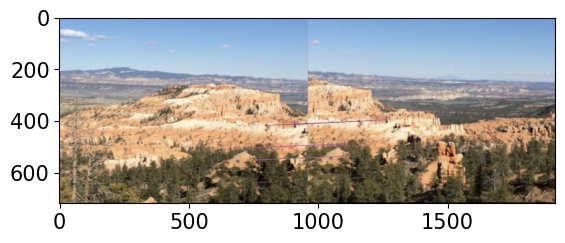

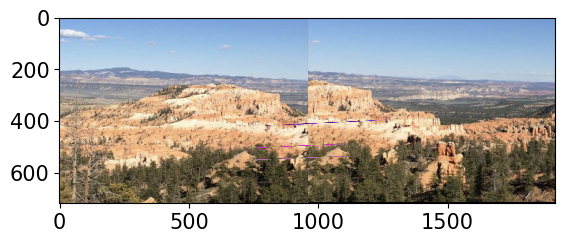

Keypoints after Matching/Thresholding: 14
inliers [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
Average keypoint distance 0.9864421647966798


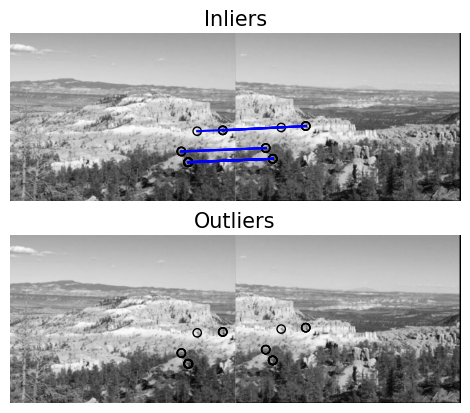

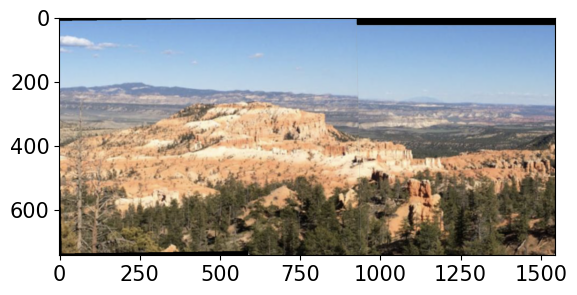

In [357]:
stitchedImage, avg_distance, num_inliers = stitchImages("//Users/murad/Downloads/image1.png",
                                          "//Users/murad/Downloads/image2.png", 
                                          blockSize = 9, 
                                          ksize=7,
                                          k=0.2,
                                          peakPercent=0.01,
                                          kpDiameter=13,
                                          ratio=0.85,
                                          threshold_residual=2) 

# Test Image

/var/folders/_w/d0wdbx015f30z7zvv4k2hcdw0000gn/T/ipykernel_73988/1789724172.py:19: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_path)[:,:,:3]  # Remove alpha channel if present


Keypoints found in left Image: 10677
Keypoints found in right Image: 16603


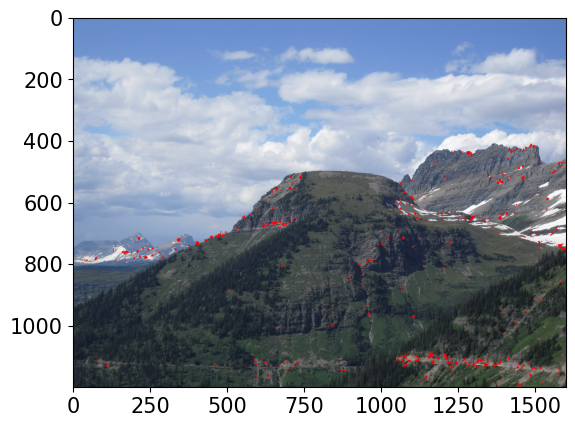

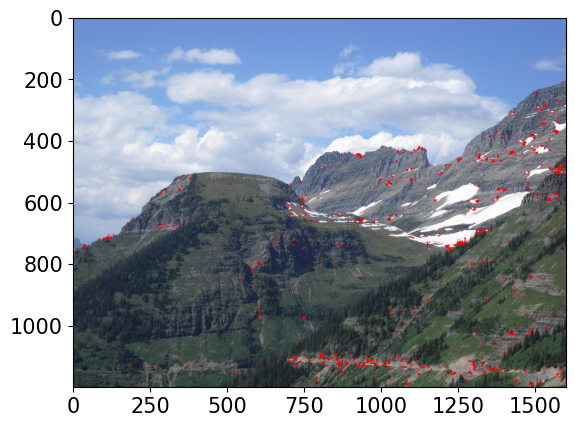

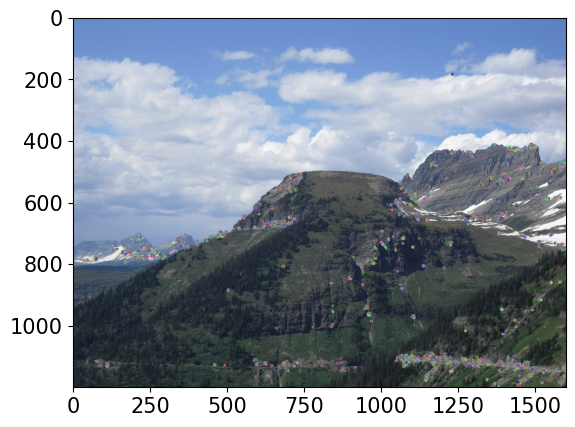

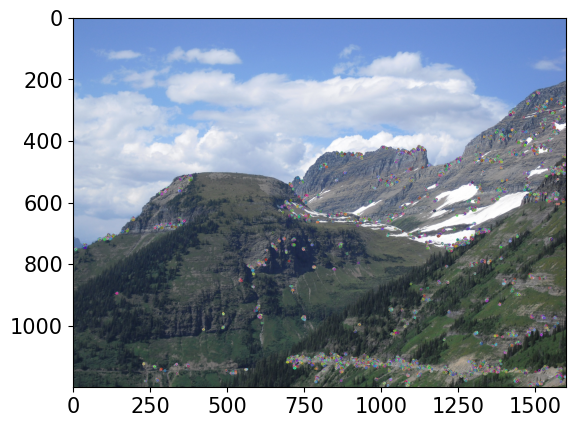

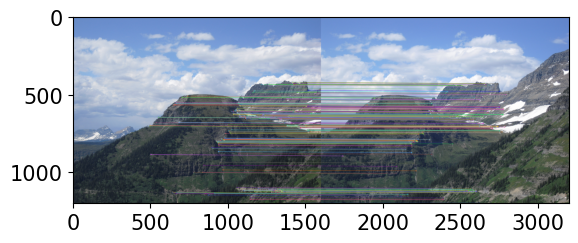

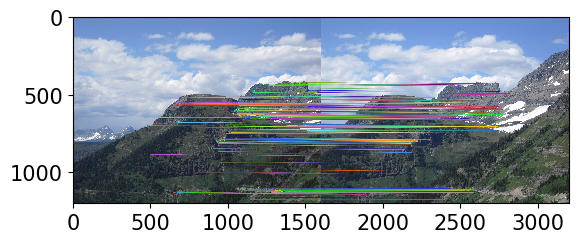

Keypoints after Matching/Thresholding: 553
inliers [ 10  11  12  18  21  23  37  39  40  44  45  46  56  57  58  62  63  64
  89  93  94  95 101 102 103 117 119 129 130 131 132 136 137 138 146 147
 148 149 150 151 152 153 155 156 158 161 163 164 165 167 168 169 170 171
 173 174 181 184 185 186 187 189 190 191 192 193 194 195 197 198 199 200
 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 218 219
 220 221 222 223 224 225 226 227 228 229 230 231 232 234 235 238 239 242
 243 244 245 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261
 262 263 264 265 266 267 268 269 270 271 272 273 274 275 277 278 279 281
 282 284 285 290 293 294 295 296 297 298 299 302 303 304 305 306 308 310
 311 312 313 315 316 317 319 320 321 323 324 325 326 327 328 329 330 332
 333 334 335 336 339 340 341 342 343 344 345 346 347 348 349 350 351 352
 354 355 356 357 358 359 361 363 364 365 367 368 369 373 374 375 376 377
 378 380 381 382 383 384 385 386 387 388 389 390 391 392 393 394 396 397


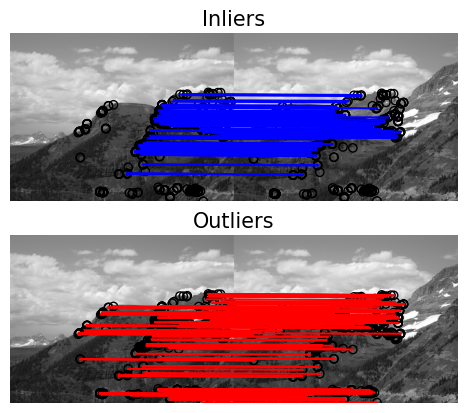

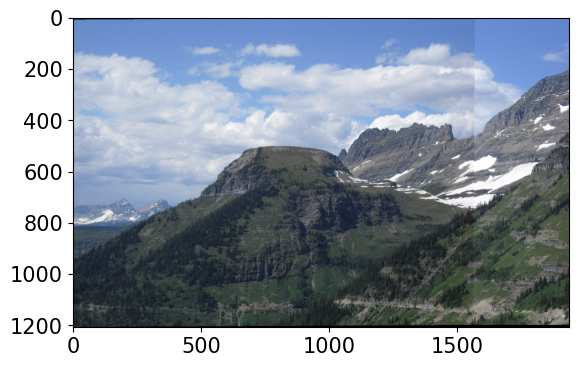

In [356]:
stitchedImage, avg_distance, num_inliers = stitchImages("//Users/murad/Downloads/1.jpg",
                                          "//Users/murad/Downloads/2.jpg", 
                                          blockSize = 9, 
                                          ksize=7,
                                          k=0.2,
                                          peakPercent=0.01,
                                          kpDiameter=13,
                                          ratio=0.85,
                                          threshold_residual=1.5) 